<a href="https://colab.research.google.com/github/kirmel4/ImageColorizerAE/blob/main/ImageColorizerAutoEncoder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Image Colorizer based on AutoEncoder (pytorch)

In [ ]:
from matplotlib.pyplot import imshow
import numpy as np
import cv2
from skimage.color import rgb2lab, lab2rgb
from skimage.transform import resize
import imageio
import random
from skimage.io import imsave
import os
import matplotlib as plt
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import torch
from torch.autograd import Variable
import numpy as np
import torch.nn.functional as F
import torchvision
from torchvision import transforms
import torch.optim as optim
from torch import nn
import matplotlib.pyplot as plt
from torch import distributions
import torchvision.transforms as T
import splitfolders
from PIL import Image
from pathlib import Path
from skimage import io
from torch.utils.data import random_split
!pip install git+https://github.com/tensorflow/docs
import tensorflow_docs.vis.embed as embed
!pip install bing-image-downloader
from bing_image_downloader import downloader
!pip install split-folders

Dataset collection

In [ ]:
downloader.download('landscapes', limit=100,  output_dir='dataset', 
adult_filter_off=True, force_replace=False, timeout=60)

In [13]:
SIZE = 256
path = '/content/dataset'

Splitting training data into train and val data

In [128]:
splitfolders.ratio(path, # The location of dataset
                   output=path, # The output location
                   seed=42, # The number of seed
                   ratio=(.9, 0, .1), # The ratio of splited dataset
                   group_prefix=None, # If your dataset contains more than one file like ".jpg", ".pdf", etc
                   move=False # If you choose to move, turn this into True
                   )

Copying files: 100 files [00:00, 132.61 files/s]


In [15]:
train_path = '/content/dataset/train/landscapes'
test_path = '/content/dataset/test/landscapes'

#Аугментация
Будем обеспечивать только афинные преобразования (без сдвига и изменения цветовой гаммы картинки), так как мы хотим научить модель сопоставлять паттерн рисунка и цвет, который он может иметь

In [16]:
augmentation = T.RandomApply(transforms=[T.RandomRotation(degrees=(0, 25)), T.RandomHorizontalFlip(p=0.5)], p=0.5)

Создадим кастомный датасет и от него наследуем тестовый для переопределение некоторых функций (так как нам не нужна аугментация на валидации)

In [75]:
class dataset(Dataset):
    def __init__(self, path, augmentation):
      self.path = path
      self.augmentation = augmentation
      self.x_data = None
      self.y_data = None
    def __getitem__(self, index):
      self.x_data, self.y_data = self.preprocessing(self.path, index, augmentation) 
      return self.x_data , self.y_data

    def __len__(self):
      return len(os.listdir(self.path))
    
    def preprocessing(self, path, index, augmentation):
      img_data = []
      img = Image.open(self.path +'/' + os.listdir(self.path)[index])
      augmented_img = self.augmentation(img)
      img=cv2.resize(np.array(augmented_img),(SIZE, SIZE))
      img_data.append(img)
      img_array = np.reshape(img_data, (len(img_data), SIZE, SIZE, 3))
      img_array = img_array.astype('float32') / 255.

      X =[]
      Y =[]

      lab = rgb2lab(img_array[0])
      X.append(lab[:,:,0]) 
      Y.append(lab[:,:,1:] / 128)
      #A and B values range from -127 to 128, 
      #so we divide the values by 128 to restrict values to between -1 and 1.
      X = np.array(X)
      Y = np.array(Y)
      X = X.reshape(X.shape+(1,)) #dimensions to be the same for X and Y
      X = np.swapaxes(X.squeeze(0), 0 ,2)
      Y = np.swapaxes(Y.squeeze(0), 0 ,2)
      return X, Y

In [84]:
class t_dataset(dataset):
  def __init__(self, path):
      self.path = path
      self.x_data = None
      self.y_data = None
  def __getitem__(self, index):
      self.x_data, self.y_data = self.preprocessing(self.path, index) 
      return self.x_data , self.y_data
  def preprocessing(self, path, index):
      img_data = []
      img = Image.open(self.path +'/' + os.listdir(self.path)[index])
      img=cv2.resize(np.array(img),(SIZE, SIZE))
      img_data.append(img)
      img_array = np.reshape(img_data, (len(img_data), SIZE, SIZE, 3))
      img_array = img_array.astype('float32') / 255.

      X =[]
      Y =[]

      lab = rgb2lab(img_array[0])
      X.append(lab[:,:,0]) 
      Y.append(lab[:,:,1:] / 128)
      X = np.array(X)
      Y = np.array(Y)
      X = X.reshape(X.shape+(1,))
      X = np.swapaxes(X.squeeze(0), 0 ,2)
      Y = np.swapaxes(Y.squeeze(0), 0 ,2)
      return X, Y

In [85]:
train_dataset = dataset(train_path, augmentation)
test_dataset = t_dataset(test_path)

In [86]:
print(len(test_dataset))
print(len(train_dataset))

10

Создание даталоадеров

In [102]:
l = len(test_dataset)
batch_size=8

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size = batch_size)
val_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)

#АвтоЭнкодер
Энкодер представляет собой свёрточную нейронную сеть со слоями 16, 16, 64, 64, 128, 128 фильтров, декодер соответственно имеет перевёрнутую архитектуру. Такая архитектура показала наилучшие результаты в процессе обучения. 

In [94]:
class Encoder(nn.Module):

    def __init__(self):
        super().__init__()
        
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(1, 16, 3),
            nn.ReLU(True),
            nn.Conv2d(16, 16, 3),
            nn.ReLU(True),
            nn.Conv2d(16, 64, 3),
            nn.ReLU(True),
            nn.Conv2d(64, 64, 3),
            nn.ReLU(True),
            nn.Conv2d(64, 128, 3),
            nn.ReLU(True),
            nn.Conv2d(128, 128, 3, padding = 1),
            nn.ReLU(True),
        )

    def forward(self, x):
      
        x = x.to(device)
        x = self.encoder_cnn(x)
        
        return x

class Decoder(nn.Module):
    
    def __init__(self):
        super().__init__()

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 3 ),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 64, 3),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 16, 3),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 16, 3),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 2, 3  ))
    def forward(self, x):

        x = x.to(device)
        x = self.decoder_conv(x)
        x = torch.tanh(x)

        return x

Определение функции ошибки и алгоритма оптимизации

In [125]:
loss_fn = torch.nn.MSELoss()

lr= 0.001

torch.manual_seed(0)

encoder = Encoder()
decoder = Decoder()
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]

optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-05)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

encoder.to(device)
decoder.to(device)

Selected device: cuda


Decoder(
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(64, 16, kernel_size=(3, 3), stride=(1, 1))
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(16, 16, kernel_size=(3, 3), stride=(1, 1))
    (7): ReLU(inplace=True)
    (8): ConvTranspose2d(16, 2, kernel_size=(3, 3), stride=(1, 1))
  )
)

Функции для тренировки и валидации

In [126]:
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer):
    encoder.train()
    decoder.train()
    train_loss = []

    for image_batch, y in dataloader: 
      
        image_batch, y = image_batch.cuda(), y.cuda()
        image_batch = image_batch.to(device)
        encoded_data = encoder(image_batch)
        decoded_data = decoder(encoded_data)
        loss = loss_fn(decoded_data, y)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

In [63]:
def test_epoch(encoder, decoder, device, dataloader, loss_fn):
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        conc_out = []
        conc_label = []
        for image_batch, y in dataloader:
            image_batch = image_batch.to(device)
            encoded_data = encoder(image_batch)
            decoded_data = decoder(encoded_data)
            conc_out.append(decoded_data.cpu())
            conc_label.append(y.cpu())
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

Фукнция для демонстрации обучения в формате gif

In [92]:
img_epoch_arr = []
def plot_training(encoder,decoder):
  img1_color=[]
  img=cv2.imread('/content/dataset/test/landscapes/Image_21.jpg')  #выберите любую картинку чтобы отследить обучение на ней
  img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
  img=cv2.resize(img,(SIZE, SIZE))

  #fig = plt.figure(figsize=(10, 7))
  #fig.add_subplot(1, 2, 1)
  #plt.imshow(img)
  #plt.axis('off')
  #plt.title("Original")

  img1_color.append(img)
  img1_color = np.array(img1_color, dtype=float)
  img1_color = rgb2lab(1.0/255*img1_color)[:,:,:,0]
  img1_color = img1_color.reshape(img1_color.shape+(1,))
  output1 = decoder(encoder(torch.Tensor(np.swapaxes(img1_color, 1,3)))).cpu().detach().numpy()
  output1 = np.swapaxes(output1, 1, 3)
  output1 = output1*128
  result = np.zeros((256, 256, 3))
  result[:,:,0] = img1_color[0][:,:,0]
  result[:,:,1:] = output1[0]
  result = np.swapaxes(result, 0, 1)
  result = lab2rgb(np.swapaxes(result, 0,1))

  img_epoch_arr.append(result)


  #fig.add_subplot(1, 2, 2)
  #plt.imshow(result)
  #plt.axis('off')
  #plt.title("Training")



#Обучение

In [96]:
num_epochs = 500
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
   train_loss =train_epoch(encoder,decoder,device,
   train_loader,loss_fn,optim)
   val_loss = test_epoch(encoder,decoder,device,val_loader,loss_fn)
   print('\n EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss, val_loss))
   diz_loss['train_loss'].append(train_loss)
   diz_loss['val_loss'].append(val_loss)
   if epoch % 5 == 0:
      plot_training(encoder,decoder)


 EPOCH 1/500 	 train loss 0.029146134853363037 	 val loss 0.027021486312150955

 EPOCH 2/500 	 train loss 0.025715617462992668 	 val loss 0.027239084243774414

 EPOCH 3/500 	 train loss 0.02462233416736126 	 val loss 0.026283185929059982

 EPOCH 4/500 	 train loss 0.024816937744617462 	 val loss 0.025957008823752403

 EPOCH 5/500 	 train loss 0.02386864274740219 	 val loss 0.024701256304979324

 EPOCH 6/500 	 train loss 0.02335585094988346 	 val loss 0.025363346561789513

 EPOCH 7/500 	 train loss 0.022545846179127693 	 val loss 0.026108721271157265

 EPOCH 8/500 	 train loss 0.0224942397326231 	 val loss 0.02511851117014885

 EPOCH 9/500 	 train loss 0.02216353453695774 	 val loss 0.02469889260828495

 EPOCH 10/500 	 train loss 0.021802879869937897 	 val loss 0.02454848773777485

 EPOCH 11/500 	 train loss 0.022077621892094612 	 val loss 0.023226818069815636

 EPOCH 12/500 	 train loss 0.021914133802056313 	 val loss 0.024384547024965286

 EPOCH 13/500 	 train loss 0.0222854018211364

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 4 pixels
  return func(*args, **kwargs)



 EPOCH 47/500 	 train loss 0.01985073834657669 	 val loss 0.020601661875844002

 EPOCH 48/500 	 train loss 0.019679537042975426 	 val loss 0.020585838705301285

 EPOCH 49/500 	 train loss 0.020130805671215057 	 val loss 0.021107757464051247

 EPOCH 50/500 	 train loss 0.019692109897732735 	 val loss 0.02054222673177719

 EPOCH 51/500 	 train loss 0.019247708842158318 	 val loss 0.020421577617526054

 EPOCH 52/500 	 train loss 0.019339783117175102 	 val loss 0.020449992269277573

 EPOCH 53/500 	 train loss 0.020006554201245308 	 val loss 0.020800519734621048

 EPOCH 54/500 	 train loss 0.019563516601920128 	 val loss 0.02052449621260166

 EPOCH 55/500 	 train loss 0.01867464743554592 	 val loss 0.020300904288887978

 EPOCH 56/500 	 train loss 0.018897991627454758 	 val loss 0.020194385200738907

 EPOCH 57/500 	 train loss 0.018853968009352684 	 val loss 0.020373424515128136

 EPOCH 58/500 	 train loss 0.01896134577691555 	 val loss 0.020371392369270325

 EPOCH 59/500 	 train loss 0.019

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 1 pixels
  return func(*args, **kwargs)



 EPOCH 102/500 	 train loss 0.017715631052851677 	 val loss 0.01911354437470436

 EPOCH 103/500 	 train loss 0.01756875216960907 	 val loss 0.01914725825190544

 EPOCH 104/500 	 train loss 0.017540747299790382 	 val loss 0.019440138712525368

 EPOCH 105/500 	 train loss 0.018239451572299004 	 val loss 0.019149255007505417

 EPOCH 106/500 	 train loss 0.017718585208058357 	 val loss 0.019275762140750885

 EPOCH 107/500 	 train loss 0.01811196468770504 	 val loss 0.019230898469686508

 EPOCH 108/500 	 train loss 0.01764710433781147 	 val loss 0.019079867750406265

 EPOCH 109/500 	 train loss 0.017473971471190453 	 val loss 0.019138500094413757

 EPOCH 110/500 	 train loss 0.01761806383728981 	 val loss 0.019217725843191147

 EPOCH 111/500 	 train loss 0.017664246261119843 	 val loss 0.019143808633089066

 EPOCH 112/500 	 train loss 0.01760483719408512 	 val loss 0.01915346086025238

 EPOCH 113/500 	 train loss 0.0174954105168581 	 val loss 0.019167130813002586

 EPOCH 114/500 	 train lo

В данной задаче мы использовали лосс. Как можно заметить он небольшой с самого начала обучения. На валидации за 500 эпох мы достигли **0.02**, хотя во время обучения опускалось до 0.018. Тем не менее, при демонстрации модель выдаёт неплохие результаты.

Сохранение и загрузка модели

In [97]:
torch.save(encoder.state_dict(), '/content/modelenc')
torch.save(decoder.state_dict(), '/content/modeldec')

In [127]:

'''
encoder = Encoder()
encoder.load_state_dict(torch.load('/content/modelenc'))
encoder.eval()
decoder = Decoder()
decoder.load_state_dict(torch.load('/content/modeldec'))
decoder.eval()
'''

"\nencoder = Encoder()\nencoder.load_state_dict(torch.load('/content/modelenc'))\nencoder.eval()\ndecoder = Decoder()\ndecoder.load_state_dict(torch.load('/content/modeldec'))\ndecoder.eval()\n"

Анимация обучения

In [ ]:
anim_file = 'train.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  for img in img_epoch_arr:
      writer.append_data(img)


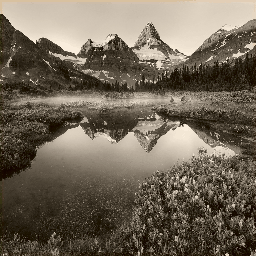

In [100]:
embed.embed_file(anim_file)

Демонстрация результатов

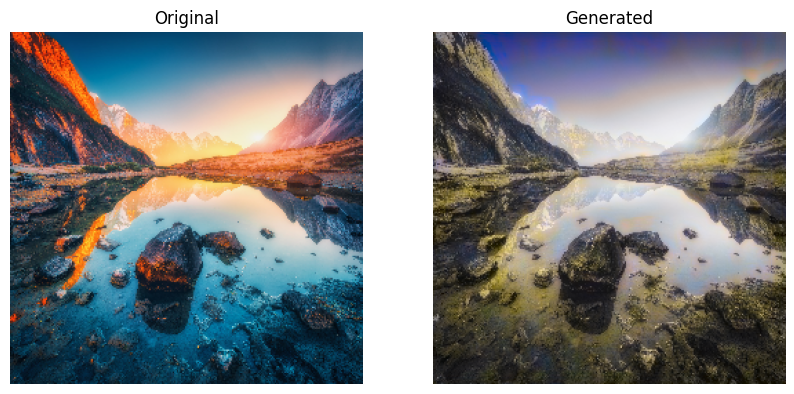

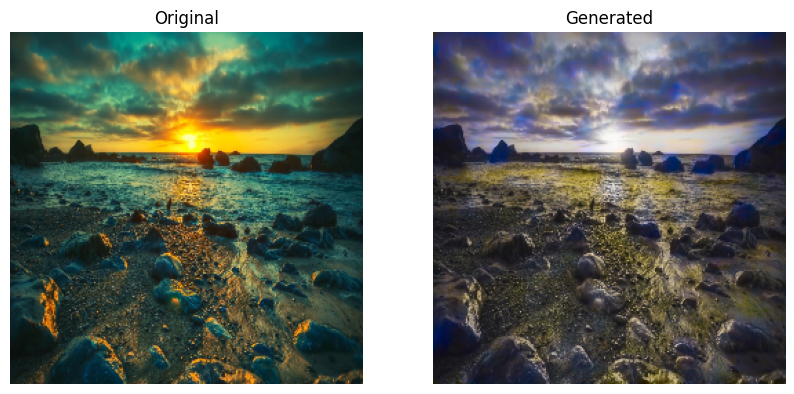

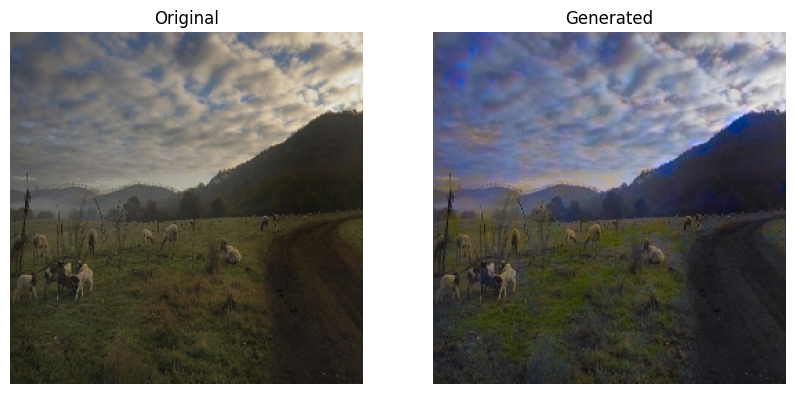

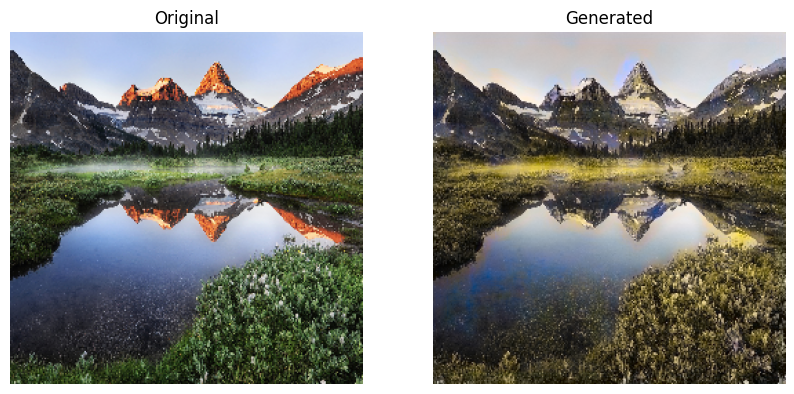

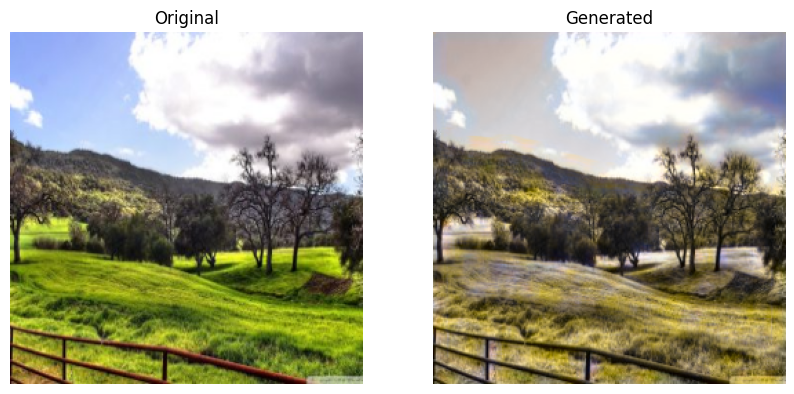

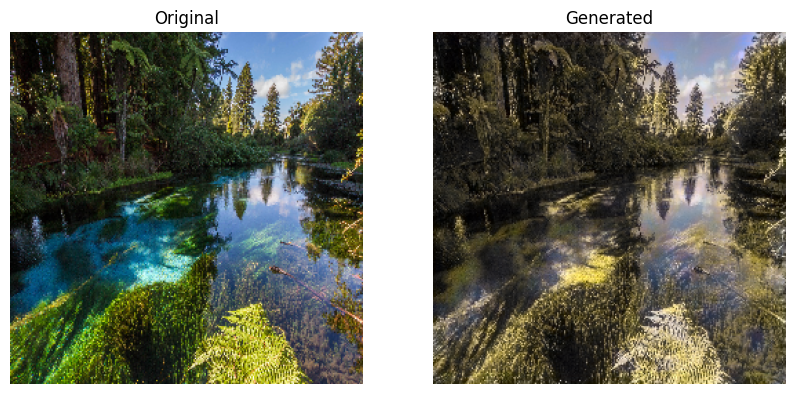

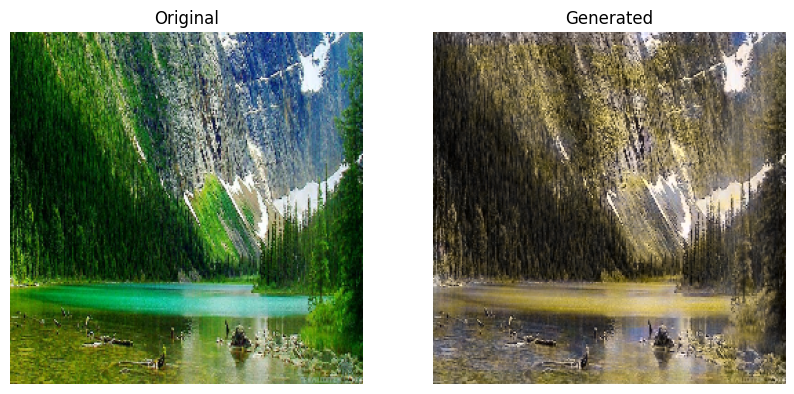

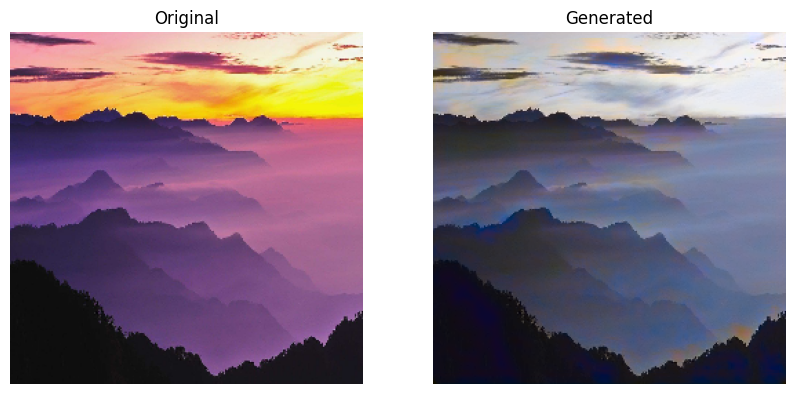

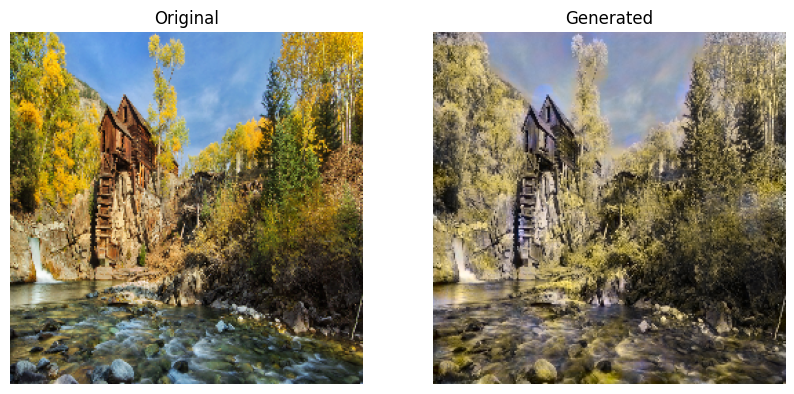

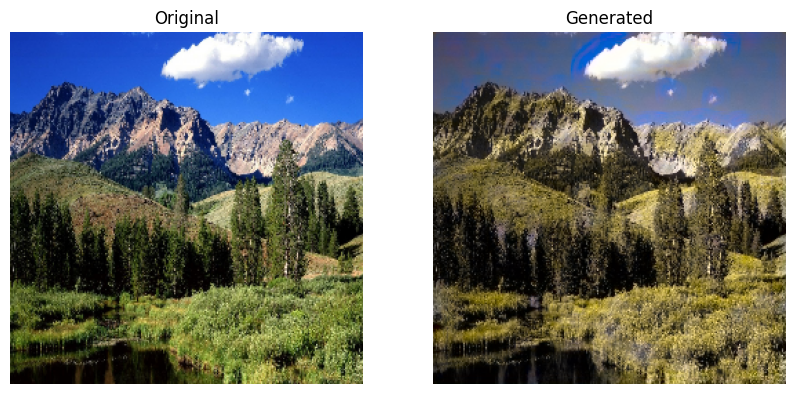

In [121]:
for i in range(len(os.listdir(test_path))):
  img1_color=[]
  #r = random.randint(0,l-1)
  img=cv2.imread(test_path + '/' + os.listdir(test_path)[i])
  #img=cv2.imread('/content/Untitled.jpg')  #you can load any picture from the internet
  img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
  img=cv2.resize(img,(SIZE, SIZE))

  fig = plt.figure(figsize=(10, 7))
  fig.add_subplot(1, 2, 1)
  plt.imshow(img)
  plt.axis('off')
  plt.title("Original")

  img1_color.append(img)
  img1_color = np.array(img1_color, dtype=float)
  img1_color = rgb2lab(1.0/255*img1_color)[:,:,:,0]
  img1_color = img1_color.reshape(img1_color.shape+(1,))
  output1 = decoder(encoder(torch.Tensor(np.swapaxes(img1_color, 1,3)))).cpu().detach().numpy()
  output1 = np.swapaxes(output1, 1, 3)
  output1 = output1*128
  result = np.zeros((SIZE, SIZE, 3))
  result[:,:,0] = img1_color[0][:,:,0]
  result[:,:,1:] = output1[0]
  result = np.swapaxes(result, 0, 1)
  result = lab2rgb(np.swapaxes(result, 0,1))

  fig.add_subplot(1, 2, 2)
  plt.imshow(result)
  plt.axis('off')
  plt.title("Generated")

  #imsave("{}.png".format(i), result)

Как мы видим, модель может хорошо понимать, где небо, где трава, где река и где дерево. Конечно, время дня для модели понять почти что невозможно, поэтому гамма может отличаться от оригинальных фотографий.
Модель можно будет сохранить и дообучать на большем размере данных.

mountains
[%] Downloading Images to /content/testing/mountains


[!!]Indexing page: 1

[%] Indexed 1 Images on Page 1.


[%] Downloading Image #1 from https://i0.wp.com/techbeasts.com/wp-content/uploads/2016/12/Nature-Mountain-HD-Wallpapers.jpg
[%] File Downloaded !



[%] Done. Downloaded 1 images.


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 8 pixels
  return func(*args, **kwargs)


Text(0.5, 1.0, 'Generated')

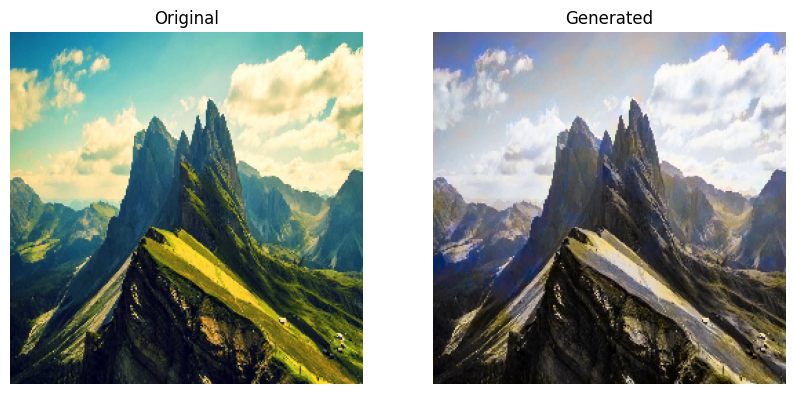

In [124]:
image = str(input())
downloader.download(image, limit=1,  output_dir='testing', 
adult_filter_off=True, force_replace=False, timeout=60)

testing_path = '/content/testing/{}/Image_1.jpg'.format(image)
img1_color=[]
img=cv2.imread(testing_path)  #you can load any picture from the internet
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
img=cv2.resize(img,(SIZE, SIZE))

fig = plt.figure(figsize=(10, 7))
fig.add_subplot(1, 2, 1)
plt.imshow(img)
plt.axis('off')
plt.title("Original")

img1_color.append(img)
img1_color = np.array(img1_color, dtype=float)
img1_color = rgb2lab(1.0/255*img1_color)[:,:,:,0]
img1_color = img1_color.reshape(img1_color.shape+(1,))
output1 = decoder(encoder(torch.Tensor(np.swapaxes(img1_color, 1,3)))).cpu().detach().numpy()
output1 = np.swapaxes(output1, 1, 3)
output1 = output1*128
result = np.zeros((SIZE, SIZE, 3))
result[:,:,0] = img1_color[0][:,:,0]
result[:,:,1:] = output1[0]
result = np.swapaxes(result, 0, 1)
result = lab2rgb(np.swapaxes(result, 0,1))

fig.add_subplot(1, 2, 2)
plt.imshow(result)
plt.axis('off')
plt.title("Generated")